In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
df=pd.read_csv('WA_Fn-UseC_-Telco-Customer-Churn.csv')

In [3]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [4]:
df["sex"]=df.gender

In [5]:
df.groupby(['sex','gender'])['customerID'].count()/df.groupby(['sex'])['customerID'].count()

sex     gender
Female  Female    1.0
Male    Male      1.0
Name: customerID, dtype: float64

In [6]:
df.groupby(['Partner','Dependents'])['customerID'].count()/df.groupby(['Partner'])['customerID'].count()

Partner  Dependents
No       No            0.900851
         Yes           0.099149
Yes      No            0.485891
         Yes           0.514109
Name: customerID, dtype: float64

In [7]:
df.groupby(['Partner','Churn'])['Churn'].count()

Partner  Churn
No       No       2441
         Yes      1200
Yes      No       2733
         Yes       669
Name: Churn, dtype: int64

In [8]:
df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
sex                  object
dtype: object

In [9]:
def str_float_tc(x):
    try:
        return float(x)
    except:
        return 0.0
df.TotalCharges=df.TotalCharges.map(lambda x: str_float_tc(x))

In [10]:
df['ten_chr']=df.tenure*df.MonthlyCharges

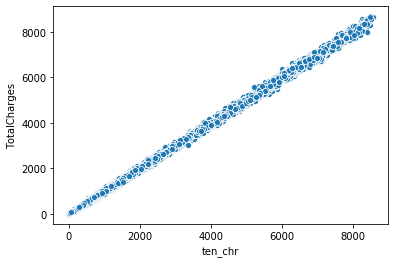

In [11]:
sns.scatterplot(df.ten_chr,df.TotalCharges)

In [12]:
df.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn', 'sex',
       'ten_chr'],
      dtype='object')

In [13]:
df.PaymentMethod.value_counts()

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: PaymentMethod, dtype: int64

In [14]:
def contract_ordinal(x):
    if x=='Month-to-month':
        return 1.0
    elif x=='One year':
        return 12.0
    else:
        return 24.0
    
def str_float_tc(x):
    try:
        return float(x)
    except:
        return 0.0

def data_cleaning(data):
    data=data.copy()
    y=data.Churn.map(lambda x: 1 if x=="Yes" else 0)
    data['gender']=data['gender'].map(lambda x: 1 if x=="Male" else 0)
    data['Partner']=data['Partner'].map(lambda x: 1 if x=="Yes" else 0)
    data['Dependents']=data['Dependents'].map(lambda x: 1 if x=="Yes" else 0)
    data.PhoneService=data.PhoneService.map(lambda x: 1 if x=="Yes" else 0)
    data=data.join(pd.get_dummies(df.MultipleLines),rsuffix="MultpleLines")
    data=data.join(pd.get_dummies(df.InternetService),rsuffix="InternetService")
    data=data.join(pd.get_dummies(df.OnlineSecurity),rsuffix="OnlineSecurity")
    data=data.join(pd.get_dummies(df.OnlineBackup),rsuffix="OnlineBackup")
    data=data.join(pd.get_dummies(df.DeviceProtection),rsuffix="DeviceProtection")
    data=data.join(pd.get_dummies(df.TechSupport),rsuffix="TechSupport")
    data=data.join(pd.get_dummies(df.StreamingTV),rsuffix="StreamingTV")
    data=data.join(pd.get_dummies(df.StreamingMovies),rsuffix="StreamingMovies")
    data['Contract']=data.Contract.map(lambda x: contract_ordinal(x))
    data['PaperlessBilling']=data['PaperlessBilling'].map(lambda x: 1 if x=="Yes" else 0)
    data=data.join(pd.get_dummies(df.PaymentMethod),rsuffix="PaymentMethod")
    data.TotalCharges=data.TotalCharges.map(lambda x: str_float_tc(x))
    data=data[['gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService',
        'Contract', 'PaperlessBilling',
       'MonthlyCharges',  'No', 'No phone service', 'Yes', 'DSL', 'Fiber optic',
       'NoInternetService', 'NoOnlineSecurity', 'No internet service',
       'YesOnlineSecurity', 'NoOnlineBackup',
       'No internet serviceOnlineBackup', 'YesOnlineBackup',
       'NoDeviceProtection', 'No internet serviceDeviceProtection',
       'YesDeviceProtection', 'NoTechSupport',
       'No internet serviceTechSupport', 'YesTechSupport', 'NoStreamingTV',
       'No internet serviceStreamingTV', 'YesStreamingTV', 'NoStreamingMovies',
       'No internet serviceStreamingMovies', 'YesStreamingMovies',
       'Bank transfer (automatic)', 'Credit card (automatic)',
       'Electronic check', 'Mailed check']]
    return data,y

X,y=data_cleaning(df)


In [15]:
X.shape

(7043, 37)

# Decision Tree

In [16]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=22)

In [17]:
from sklearn.tree import DecisionTreeClassifier, export_graphviz
dtc=DecisionTreeClassifier(criterion="entropy")
dtc.fit(X_train,y_train)
print("training accuracy",dtc.score(X_train,y_train))
print("testing accuracy",dtc.score(X_test,y_test))

training accuracy 0.9977281332828474
testing accuracy 0.7206132879045997


In [18]:
export_graphviz(decision_tree=dtc,out_file='telco_tree.dot',feature_names=X.columns,\
               filled=True, rounded=True,special_characters=True)

In [19]:
# generate plot
#!pip install pygraphviz pydotplus
#add graphviz bin folder to path variable and restart system
!conda install --yes --prefix {sys.prefix} pydotplus
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dtc,feature_names=X.columns, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


EnvironmentLocationNotFound: Not a conda environment: C:\Users\rohan\Desktop\PYTHON self\class 5\telecom final\{sys.prefix}

C:\Users\rohan\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.645693 to fit



In [20]:
for depth in range(1,25):
    dtc=DecisionTreeClassifier(criterion="entropy",max_depth=depth)
    dtc.fit(X_train,y_train)
    print(depth,"training accuracy",dtc.score(X_train,y_train))
    print(depth,"testing accuracy",dtc.score(X_test,y_test))

1 training accuracy 0.7385460053010223
1 testing accuracy 0.7228847245883021
2 training accuracy 0.7459295721317682
2 testing accuracy 0.7319704713231119
3 training accuracy 0.7836046951912155
3 testing accuracy 0.7575241340147644
4 training accuracy 0.7836046951912155
4 testing accuracy 0.7575241340147644
5 training accuracy 0.8055660734570238
5 testing accuracy 0.7791027825099376
6 training accuracy 0.8114350624763347
6 testing accuracy 0.7756956274843839
7 training accuracy 0.8218477849299508
7 testing accuracy 0.7728563316297559
8 training accuracy 0.8358576296857251
8 testing accuracy 0.7717206132879046
9 training accuracy 0.8485422188564937
9 testing accuracy 0.7626348665530949
10 training accuracy 0.8665278303672851
10 testing accuracy 0.7495741056218058
11 training accuracy 0.8858386974630822
11 testing accuracy 0.7416240772288473
12 training accuracy 0.9024990533888678
12 testing accuracy 0.7410562180579217
13 training accuracy 0.9206739871260886
13 testing accuracy 0.74446337

In [21]:
y_train.value_counts()

0    3901
1    1381
Name: Churn, dtype: int64

In [22]:
dtc=DecisionTreeClassifier(criterion="entropy",max_depth=5)
dtc.fit(X_train,y_train)
print("training accuracy",dtc.score(X_train,y_train))
print("testing accuracy",dtc.score(X_test,y_test))

training accuracy 0.8055660734570238
testing accuracy 0.7791027825099376


In [23]:
y_hat=dtc.predict(X_test)

In [24]:
##y_hat1 = dtc.predict(X_train)

In [25]:
dtc.predict_proba(X_test)

array([[0.9932341 , 0.0067659 ],
       [0.73493976, 0.26506024],
       [0.9932341 , 0.0067659 ],
       ...,
       [0.8349835 , 0.1650165 ],
       [0.57920792, 0.42079208],
       [0.98780488, 0.01219512]])

In [26]:
from sklearn.metrics import confusion_matrix,classification_report
print(classification_report(y_hat,y_test))

              precision    recall  f1-score   support

           0       0.90      0.81      0.86      1412
           1       0.46      0.64      0.54       349

    accuracy                           0.78      1761
   macro avg       0.68      0.73      0.70      1761
weighted avg       0.81      0.78      0.79      1761



In [27]:
highest=0
for depth in range(3,15):
    for ss in range(2,20):
        for msl in range(2,12):
            dtc=DecisionTreeClassifier(criterion="entropy",\
                                       max_depth=depth,\
                                       min_samples_split=ss,
                                      min_samples_leaf=msl)
            dtc.fit(X_train,y_train)
            if dtc.score(X_test,y_test)>highest:
                highest=dtc.score(X_test,y_test)
                print(depth,ss,msl,"training accuracy",dtc.score(X_train,y_train))
                print(depth,ss,msl,"testing accuracy",dtc.score(X_test,y_test))


3 2 2 training accuracy 0.7836046951912155
3 2 2 testing accuracy 0.7575241340147644
5 2 2 training accuracy 0.8055660734570238
5 2 2 testing accuracy 0.7791027825099376
5 2 3 training accuracy 0.8051874290041651
5 2 3 testing accuracy 0.7796706416808632
6 2 10 training accuracy 0.8102991291177585
6 2 10 testing accuracy 0.7802385008517888
7 2 7 training accuracy 0.8171147292692162
7 2 7 testing accuracy 0.7808063600227144
7 2 8 training accuracy 0.8167360848163574
7 2 8 testing accuracy 0.7825099375354913
7 2 9 training accuracy 0.8169254070427868
7 2 9 testing accuracy 0.7847813742191937
8 2 10 training accuracy 0.8265808405906854
8 2 10 testing accuracy 0.7876206700738216
9 2 11 training accuracy 0.8299886406664142
9 2 11 testing accuracy 0.7893242475865985


In [28]:
#final model...
dtc=DecisionTreeClassifier(criterion="entropy",max_depth=9,\
                           min_samples_split=2,min_samples_leaf=11)
dtc.fit(X_train,y_train)
print("training accuracy",dtc.score(X_train,y_train))
print("testing accuracy",dtc.score(X_test,y_test))

training accuracy 0.8299886406664142
testing accuracy 0.7893242475865985


In [29]:
export_graphviz(decision_tree=dtc,out_file='telco_tree.dot',feature_names=X.columns,\
               filled=True, rounded=True,special_characters=True)

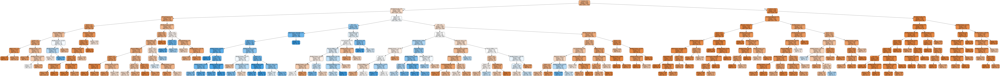

In [30]:
# generate plot
#!pip install pygraphviz pydotplus
#add graphviz bin folder to path variable and restart system
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dtc,feature_names=X.columns, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [31]:
highest=0
for depth in range(3,15):
    for ss in range(2,20):
        for msl in range(2,12):
            dtc=DecisionTreeClassifier(criterion="gini",\
                                       max_depth=depth,\
                                       min_samples_split=ss,
                                      min_samples_leaf=msl)
            dtc.fit(X_train,y_train)
            if dtc.score(X_test,y_test)>highest:
                highest=dtc.score(X_test,y_test)
                print(depth,ss,msl,"training accuracy",dtc.score(X_train,y_train))
                print(depth,ss,msl,"testing accuracy",dtc.score(X_test,y_test))


3 2 2 training accuracy 0.7881484286255206
3 2 2 testing accuracy 0.7654741624077229
4 2 2 training accuracy 0.7949640287769785
4 2 2 testing accuracy 0.7700170357751278
5 2 2 training accuracy 0.8068913290420295
5 2 2 testing accuracy 0.7779670641680864
5 2 7 training accuracy 0.806134040136312
5 2 7 testing accuracy 0.778534923339012
6 2 2 training accuracy 0.8129496402877698
6 2 2 testing accuracy 0.7791027825099376
6 2 3 training accuracy 0.8121923513820523
6 2 3 testing accuracy 0.7836456558773425
6 2 4 training accuracy 0.8118137069291935
6 2 4 testing accuracy 0.7842135150482681
6 2 6 training accuracy 0.8121923513820523
6 2 6 testing accuracy 0.7847813742191937
6 2 7 training accuracy 0.8118137069291935
6 2 7 testing accuracy 0.7859170925610448


# RandomForest

In [32]:
from sklearn.ensemble import RandomForestClassifier

In [33]:
rfc=RandomForestClassifier(n_estimators=100,criterion="entropy",max_depth=9,\
                           min_samples_split=2,min_samples_leaf=11,\
                           random_state=22)
rfc.fit(X_train,y_train)
print("training accuracy",rfc.score(X_train,y_train))
print("testing accuracy",rfc.score(X_test,y_test))

training accuracy 0.8252555850056796
testing accuracy 0.7859170925610448


In [34]:
rfc.estimators_[0]

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=9,
                       max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=11, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=895331189, splitter='best')

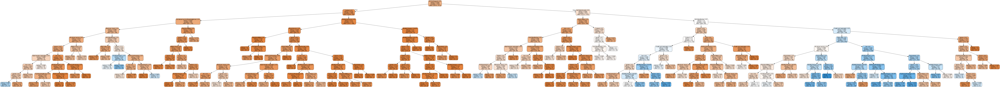

In [35]:
# generate plot
#!pip install pygraphviz pydotplus
#add graphviz bin folder to path variable and restart system
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(rfc.estimators_[0],feature_names=X.columns, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

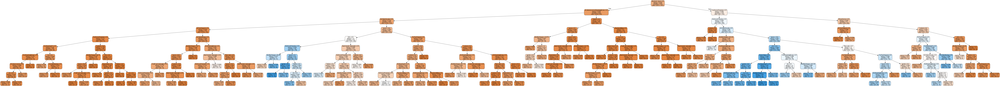

In [36]:
# generate plot
#!pip install pygraphviz pydotplus
#add graphviz bin folder to path variable and restart system
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(rfc.estimators_[1],feature_names=X.columns, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [37]:
print(classification_report(y_test,rfc.predict(X_test)))

              precision    recall  f1-score   support

           0       0.81      0.91      0.86      1273
           1       0.67      0.46      0.54       488

    accuracy                           0.79      1761
   macro avg       0.74      0.68      0.70      1761
weighted avg       0.77      0.79      0.77      1761



In [38]:
highest=0
for depth in range(3,15):
    for ss in range(2,20):
        for msl in range(2,12):
            rfc=RandomForestClassifier(n_estimators=100,criterion="entropy",max_depth=depth,\
                           min_samples_split=ss,min_samples_leaf=msl,\
                           random_state=22,n_jobs=-1)
            rfc.fit(X_train,y_train)
            if rfc.score(X_test,y_test)>highest:
                highest=rfc.score(X_test,y_test)
                print(depth,ss,msl)
                print("training accuracy",rfc.score(X_train,y_train))
                print("testing accuracy",rfc.score(X_test,y_test))


3 2 2
training accuracy 0.7934494509655433
testing accuracy 0.7654741624077229
4 2 2
training accuracy 0.8042408178720182
testing accuracy 0.7734241908006815
5 2 2
training accuracy 0.8078379401741764
testing accuracy 0.7756956274843839
5 2 7
training accuracy 0.8072699734948883
testing accuracy 0.7762634866553095
6 2 2
training accuracy 0.8131389625141991
testing accuracy 0.7836456558773425
6 2 3
training accuracy 0.8135176069670579
testing accuracy 0.7842135150482681
6 7 2
training accuracy 0.8146535403256342
testing accuracy 0.7859170925610448
6 8 2
training accuracy 0.8138962514199167
testing accuracy 0.7864849517319704
8 2 6
training accuracy 0.8252555850056796
testing accuracy 0.7876206700738216
8 2 11
training accuracy 0.8220371071563801
testing accuracy 0.7898921067575241
11 14 2
training accuracy 0.8510034078000758
testing accuracy 0.7915956842703009


In [39]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import recall_score,make_scorer

In [40]:
scoring=make_scorer(recall_score,greater_is_better=True)

In [41]:
parameters={'n_estimators':[100,200],'max_depth':np.arange(4,12),\
           'min_samples_leaf':np.arange(2,8)}

In [42]:
model=RandomForestClassifier(criterion='gini',random_state=22)

In [43]:
gs=GridSearchCV(model,param_grid=parameters,scoring=scoring,n_jobs=-1,\
               verbose=1,cv=4)
gs.fit(X_train,y_train)

Fitting 4 folds for each of 96 candidates, totalling 384 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 384 out of 384 | elapsed:   44.8s finished


GridSearchCV(cv=4, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False, random_state=22,
                                              verbose=0, warm_start=False),
             iid='warn', n_jobs=-1,
             param_grid={'ma

In [44]:
print(gs.best_score_)
print(gs.best_estimator_)

0.5075898276630082
RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=22, verbose=0,
                       warm_start=False)


In [45]:
#final model
rfc=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=22, verbose=0,
                       warm_start=False)
rfc.fit(X_train,y_train)
print("accuracy",rfc.score(X_train,y_train))

print("accuracy",rfc.score(X_test,y_test))


accuracy 0.8517606967057932
accuracy 0.7859170925610448
